## Repr similarity

In [1]:
import os
import torch
import random
import numpy as np
import pandas as pd
from sklearn.manifold import MDS
from sklearn.metrics import pairwise_distances
import seaborn as sns
import matplotlib.pyplot as plt
from utils import load_experiment

np.random.seed(42)
random.seed(42)

def get_encodings(model_dict, idxs, task_num=2):
    dataset, model, config = load_experiment(model_dict['config'], model_dict['ckpt'])
    X, y = dataset[idxs]
    y = y.detach().numpy()
    if task_num==0:
        y = y[:,0]//3*4 + y[:,1]//3
    elif task_num==1:
        condition = y[:,0] == y[:,1]         
    elif task_num==2:
        condition = y[:,0] <= y[:,1]
    elif task_num==3:
        condition = (y[:,0] < 6) | ((y[:,0] >= 6) & (y[:,1] >= 6)) 

    try:
        y = np.where(condition, 1, 0)
    except:
        pass
    
    mu, logvar = model.encode(X)
    #Z = model.reparameterize(mu, logvar).detach().numpy()
    mu = mu.detach().numpy()
    # logvar = logvar.detach().numpy()
    #Z = np.concatenate([mu, logvar], axis=1)
    return mu, y

def compute_dissimilarity_m(idxs, enc, **kwargs):
    l = enc.shape[1]
    df = pd.DataFrame(enc, columns=[f'z{i}' for i in range(l)])
    df['idx'] = idxs
    df.set_index('idx', inplace=True)
    return .5 * (1 - df.T.corr())

def compute_dissimilarity_m1(idxs, enc, **kwargs):
    return pd.DataFrame(data=pairwise_distances(enc), columns=idxs, index=idxs)


def get_embeddings(diss_m, n_components=2):
    embedding = MDS(n_components=n_components, dissimilarity='precomputed', random_state=42)
    out_ = embedding.fit_transform(diss_m)
    return out_

def get_idx2label(row):
    return f'{row[169]},{row[170]}' 

### Classification Tasks

#### select images

In [2]:
data = pd.read_csv('data/mazes_200k_2corridors_13x13.csv', header=None)
data = data.iloc[185_000:]
data['diff'] = data.iloc[:,169] - data.iloc[:,170]
#data = data.sort_values(by=['diff'])
n_imgs = 1000
idxs = data.sample(n_imgs).index
selected_idxs = [
    185_044, #0,12
    199_915, #2,10
    194_158, #4,8
    189_971, #6,6
    190_889, #8,4
    187_869, #10,2
    193_280, #12,0
    191126, #0,0
    185419, #2,2
    198997, #10,10
    197722, #12,12
    195734, #2,4
    194955, #4,2
    198524, #8,10
    185387, #10,8
    198185, #6,12
    192299, #6,0
    191412, #12,6
    188274, #0,6
    #185250, #6,4
    #196000, #6,8
    190549, #1,5
    190769, #5,1
    186536, #7,11
    188431, #11,7
    
    
]
idxs = idxs.union(selected_idxs)
data = data.loc[idxs].sort_values(by=['diff'])
idxs = data.index
idx2label = data.apply(get_idx2label, axis=1).to_dict()

In [3]:
data[(data.iloc[:,169]==11)&(data.iloc[:,170]==7)]

,0,1,2,3,4,5,6,7,8,9,...,162,163,164,165,166,167,168,169,170,diff
194238,1,1,1,1,1,1,1,1,1,1,...,0,0,1,1,0,1,1,11,7,4
189755,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,1,1,1,11,7,4
197036,1,1,1,1,1,1,1,1,1,0,...,0,0,0,1,1,1,1,11,7,4
186373,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,1,1,1,11,7,4
188431,1,1,1,1,1,1,1,1,1,1,...,0,0,1,1,1,1,1,11,7,4
194318,1,1,1,1,1,1,1,1,1,1,...,0,0,0,1,1,1,1,11,7,4


In [4]:
reidxs = {idx: i for i, idx in enumerate(idxs)}
reidx2label = {reidxs[idx]: idx2label[idx] for idx in idxs}
selected_reidxs = [reidxs[selected_idx] for selected_idx in selected_idxs]


# idx to be annotated in the scatter plot
idx_toLabel = []#list(range(0, n_imgs, 50))
idx_toLabel.extend(selected_reidxs)

#### select models

In [5]:
models = {

    'task0':{
        'base_high': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'base_low': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
        'distorted_high': {
            'config': 'logs/BetaVAE_CLF_task0_25/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task0_25/max_c_10/checkpoints/last.ckpt'
        },
        'distorted_low': {
            'config': 'logs/BetaVAE_CLF_task0_25/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task0_25/max_c_0.3/checkpoints/last.ckpt'
        },
    },

    'task1':{
        'base_high': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'base_low': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
        'distorted_high': {
            'config': 'logs/BetaVAE_CLF_task1/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task1/max_c_10/checkpoints/last.ckpt'
        },
        'distorted_low': {
            'config': 'logs/BetaVAE_CLF_task1/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task1/max_c_0.3/checkpoints/last.ckpt'
        },
    },

    'task2':{
        'base_high': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'base_low': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
        'distorted_high': {
            'config': 'logs/BetaVAE_CLF_task2/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task2/max_c_10/checkpoints/last.ckpt'
        },
        'distorted_low': {
            'config': 'logs/BetaVAE_CLF_task2/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task2/max_c_0.3/checkpoints/last.ckpt'
        },
    },

    'task3':{
        'base_high': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'base_low': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
        'distorted_high': {
            'config': 'logs/BetaVAE_CLF_task3/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task3/max_c_10/checkpoints/last.ckpt'
        },
        'distorted_low': {
            'config': 'logs/BetaVAE_CLF_task3/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task3/max_c_0.3/checkpoints/last.ckpt'
        },  
    },
}

#### plot

In [8]:
def plot_diss_m(diss_m, title, **kwargs):
    fig, ax = plt.subplots(figsize=(6, 3))
    #ax.set_title(title)
    sns.heatmap(diss_m, ax=ax, annot=False, cmap='summer_r', xticklabels=False, yticklabels=False, **kwargs)
    return fig, ax

def plot_embeddings(emb, y, idx_toLabel, reidx2label, title):
    fig, ax = plt.subplots(figsize=(5, 5))
    #ax.set_title(title)
    sns.scatterplot(x=emb[:,0], y=emb[:,1], hue=y, palette='Pastel2', ax=ax)
    #ax.set_xticks([])
    #ax.set_yticks([])
    for i in idx_toLabel:
        txt = reidx2label[i]
        ax.annotate(txt, (emb[i,0], emb[i,1]), size=10)
        ax.scatter(x=emb[i,0], y=emb[i,1], facecolor='none', edgecolor='black')
    return fig, ax

def plot_embeddings_3d(emb, y, idx_toLabel, reidx2label, title):
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title(title)
    ax.scatter(emb[:,0], emb[:,1], emb[:,2], c=y, s=10, cmap='Pastel2')
    for i in idx_toLabel:
        txt = reidx2label[i]
        ax.text(emb[i,0], emb[i,1], emb[i,2], txt, size=10)
        
    return fig, ax

def save_fig(in_fig, out_file):
    in_fig.savefig(out_file, bbox_inches='tight', pad_inches=0.1)
    
def get_fig_name(parent_dir, model_name, plot_type):
    """
    parent_dir : eucl_diss | corr_diss
    plot_type : dissM | emb
    """
    _, _, task, diss_metric = parent_dir.split('/')
    model_type, capacity = model_name.split('_')
    filename = f'{diss_metric[:4]}_t{task[-1]}_{model_type}_{capacity}_{plot_type}.png'
    out_dir = os.path.join(parent_dir, model_type, capacity)
    os.makedirs(out_dir, exist_ok=True)
    return os.path.join(out_dir, filename)

##### base vs task2

**euclidean dissimilarity**

/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/var/folders/65/017sb9lj6036j9yxl_qx_d940000gn/T/ipykernel_2237/3821662171.py:22: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/var/folders/65/017sb9lj6036j9yxl_qx_d940000gn/T/ipykernel_2237/3821662171.py:22: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, 

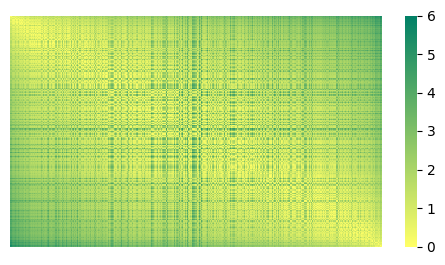

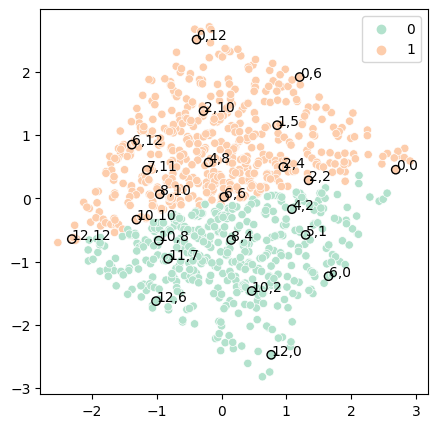

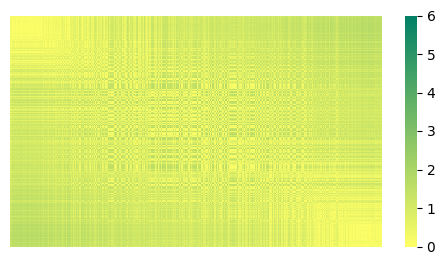

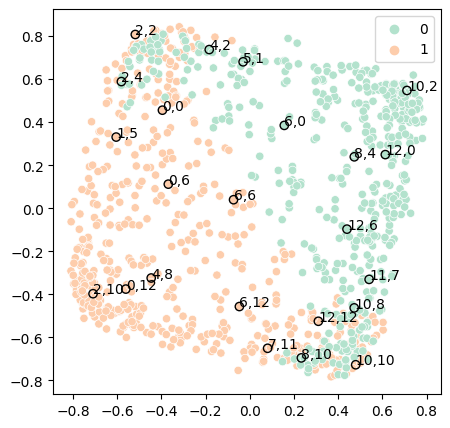

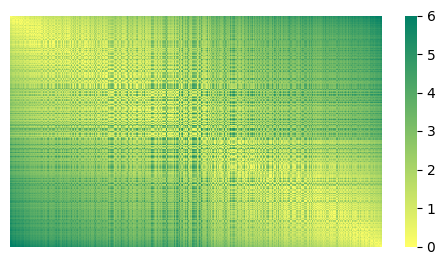

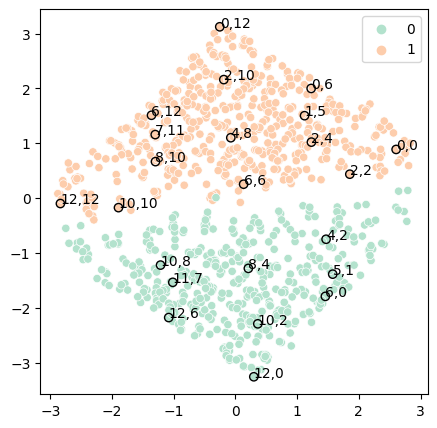

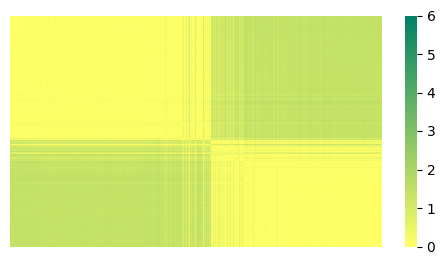

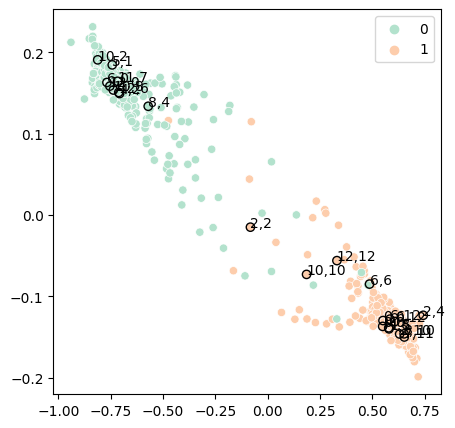

In [9]:
np.random.seed(42)
random.seed(42)

task = 'task2'
parent_dir = f'imgs/clf_bias/{task}/eucl_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=2)
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity**

/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_st

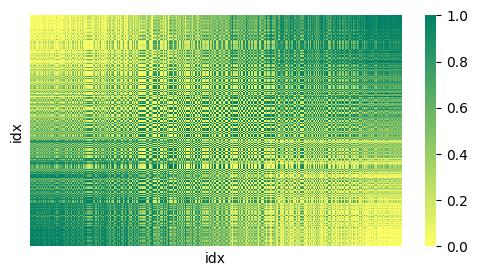

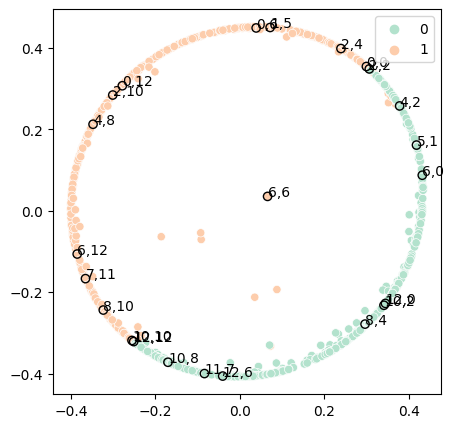

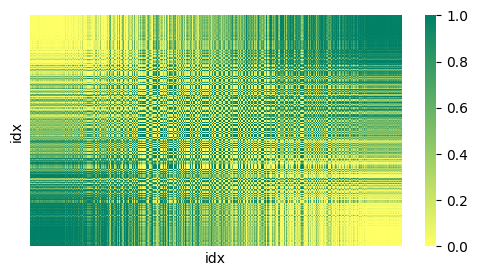

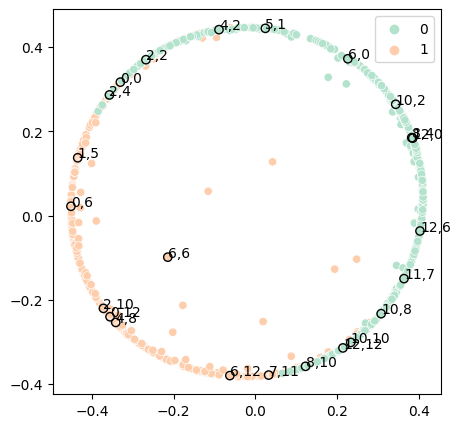

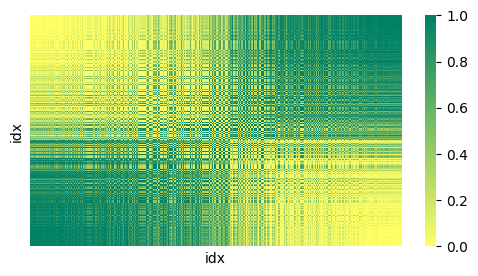

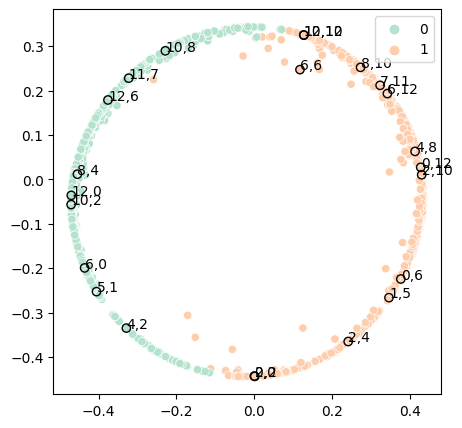

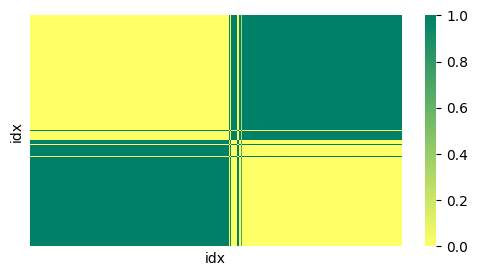

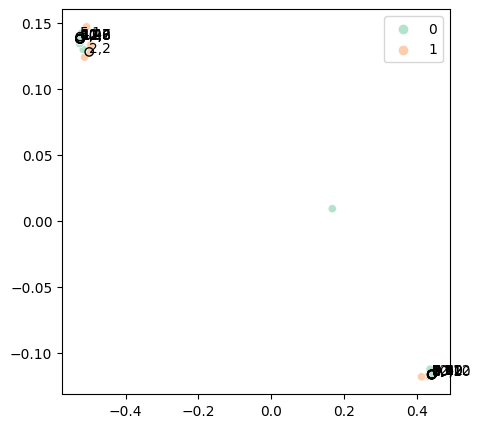

In [10]:
np.random.seed(42)
random.seed(42)

task = 'task2'
parent_dir = f'imgs/clf_bias/{task}/corr_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=2)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

**correlation dissimilarity 3D**

In [ ]:
for model_name, model_dict in models['experiment2'].items():
    Z, y = get_encodings(model_dict, idxs, task_num=2)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m, n_components=3)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    fig, ax = plot_embeddings_3d(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')
    fig.show()

---

In [ ]:
#buoni
idxs = [
    185_044, #00-12
    199_915, #02-10
    194_158, #04-08
    189_971, #06-06
    190_889, #08-04
    187_869, #10-02
    193_280, #12-00
]

---

In [46]:
#plot 3d points using plotly
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(
    x=emb[:,0],
    y=emb[:,1],
    z=emb[:,2],
    mode='markers',
    text=list(reidx2label.values()),
    # marker=dict(
    #     size=12,
    #     #color=s.index,                # set color to an array/list of desired values
    #     colorscale='Viridis',   # choose a colorscale
    #     opacity=0.8
    # )
)])

fig.show()

##### base vs task3

**euclidean dissimilarity**

/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/var/folders/65/017sb9lj6036j9yxl_qx_d940000gn/T/ipykernel_2237/3950625112.py:22: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/var/folders/65/017sb9lj6036j9yxl_qx_d940000gn/T/ipykernel_2237/3950625112.py:22: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, 

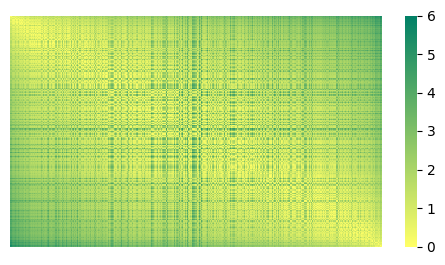

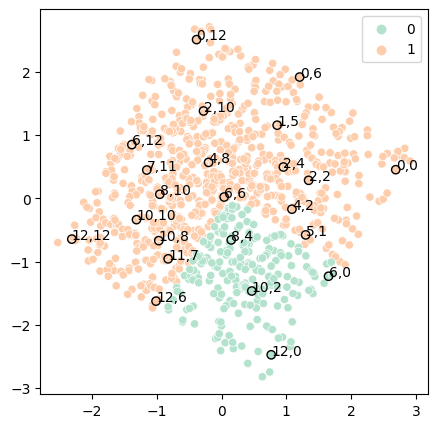

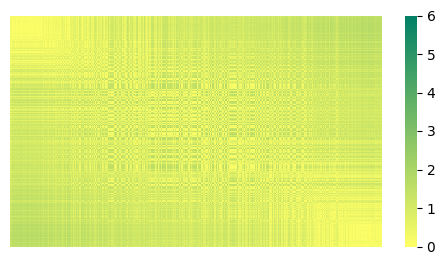

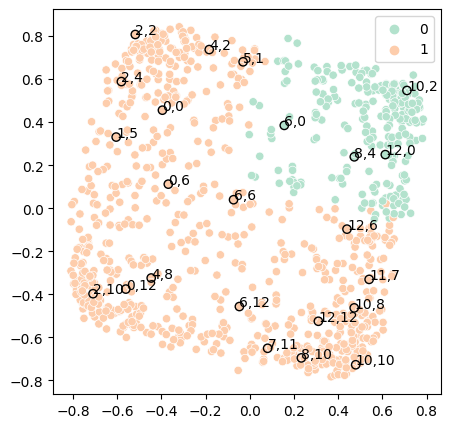

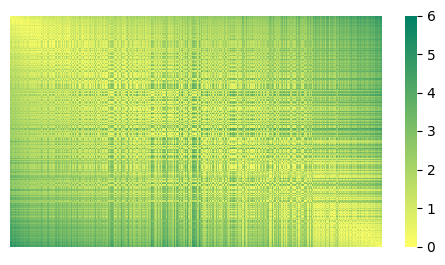

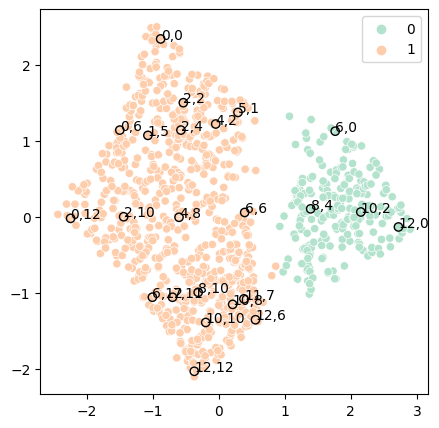

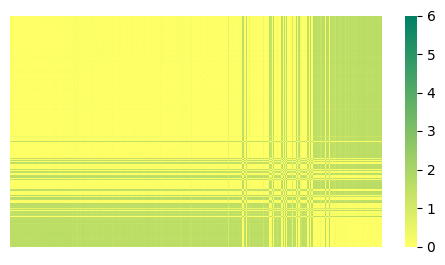

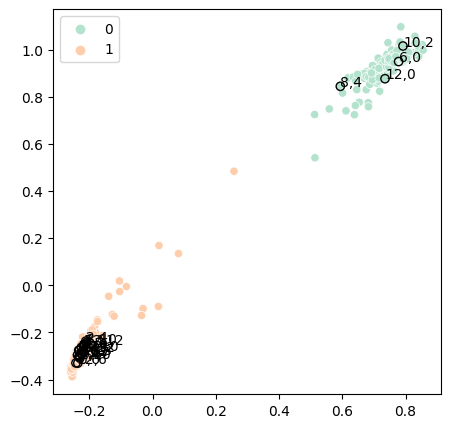

In [11]:
np.random.seed(42)
random.seed(42)

task = 'task3'
parent_dir = f'imgs/clf_bias/{task}/eucl_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=3)
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity**

/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/var/folders/65/017sb9lj6036j9yxl_qx_d940000gn/T/ipykernel_2237/2834476161.py:22: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/var/folders/65/017sb9lj6036j9yxl_qx_d940000gn/T/ipykernel_2237/2834476161.py:22: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, 

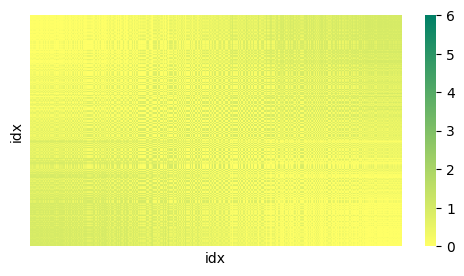

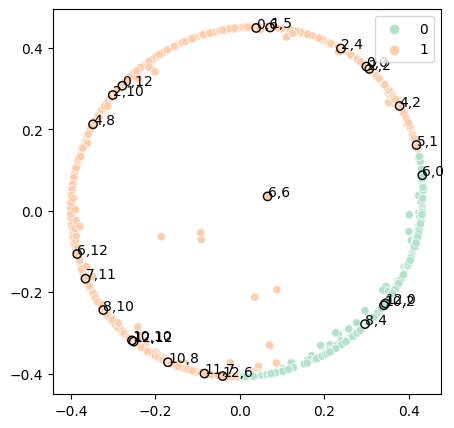

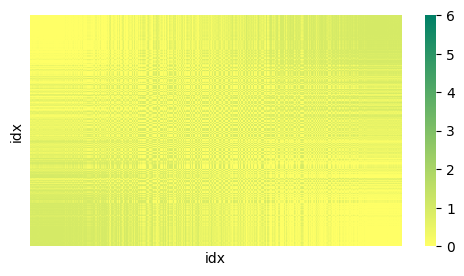

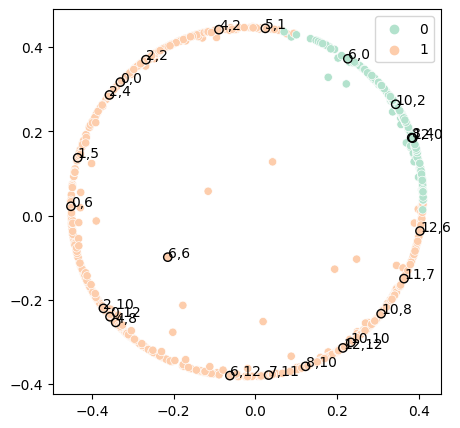

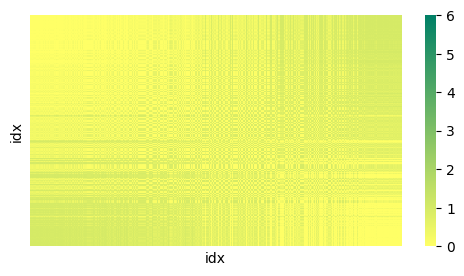

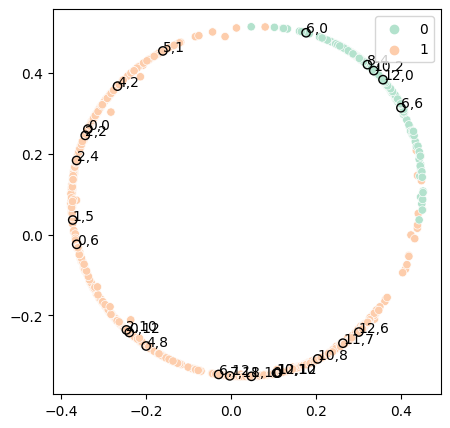

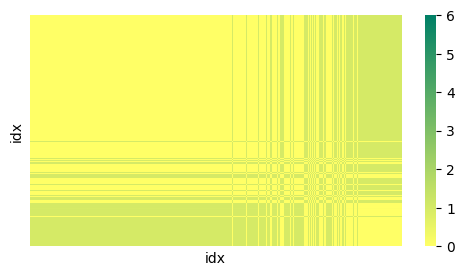

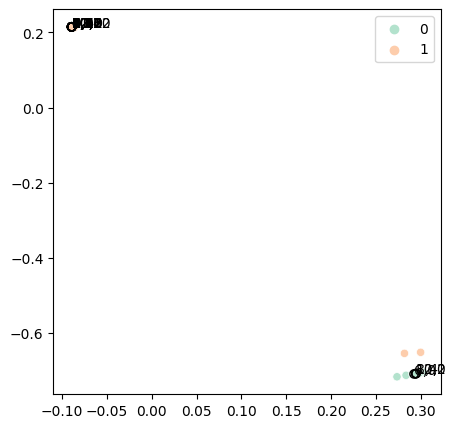

In [12]:
np.random.seed(42)
random.seed(42)

task = 'task3'
parent_dir = f'imgs/clf_bias/{task}/corr_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=3)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity 3D**

In [ ]:
for model_name, model_dict in models['experiment3'].items():
    Z, y = get_encodings(model_dict, idxs, task_num=3)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m, n_components=3)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    fig, ax = plot_embeddings_3d(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')
    fig.show()

##### base vs task1

**euclidean dissimilarity**

/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/var/folders/65/017sb9lj6036j9yxl_qx_d940000gn/T/ipykernel_2237/2737433813.py:22: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/var/folders/65/017sb9lj6036j9yxl_qx_d940000gn/T/ipykernel_2237/2737433813.py:22: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, 

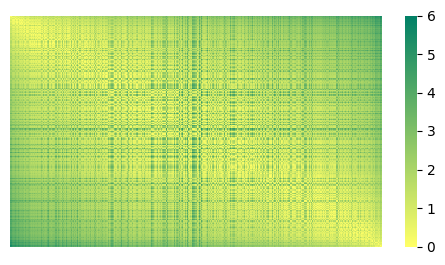

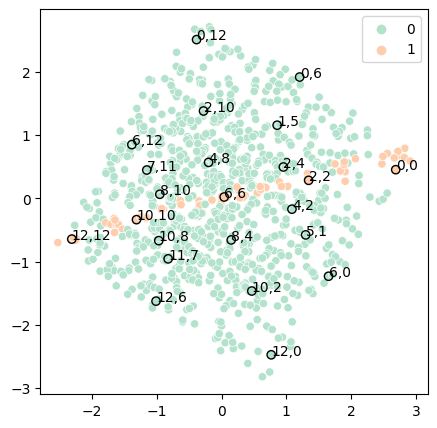

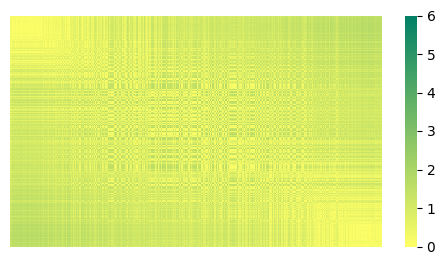

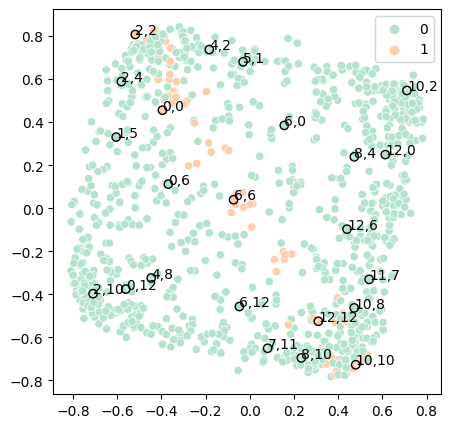

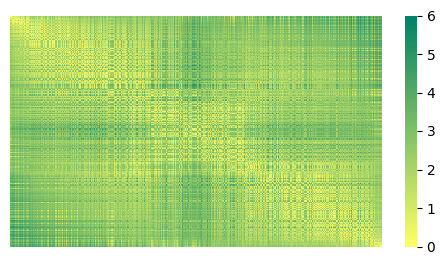

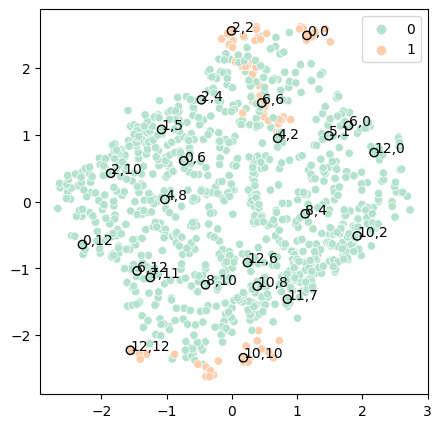

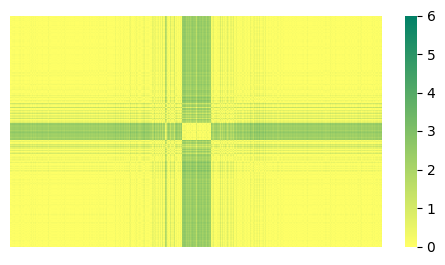

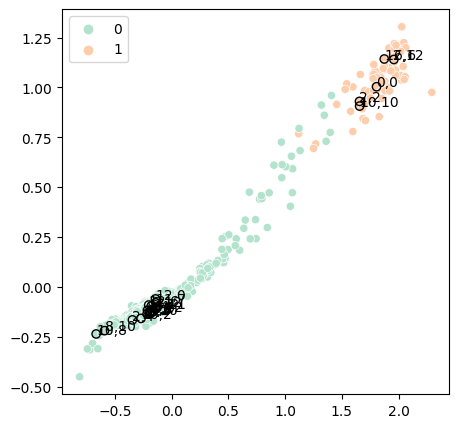

In [13]:
np.random.seed(42)
random.seed(42)

task = 'task1'
parent_dir = f'imgs/clf_bias/{task}/eucl_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=1)
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity**

/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/var/folders/65/017sb9lj6036j9yxl_qx_d940000gn/T/ipykernel_2237/1823544954.py:22: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/var/folders/65/017sb9lj6036j9yxl_qx_d940000gn/T/ipykernel_2237/1823544954.py:22: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, 

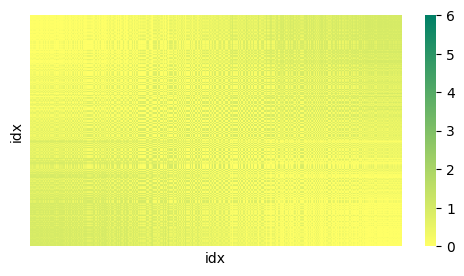

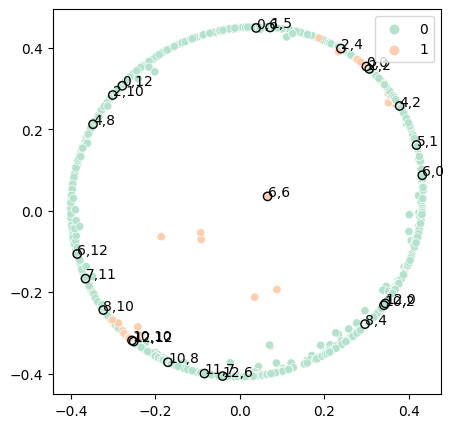

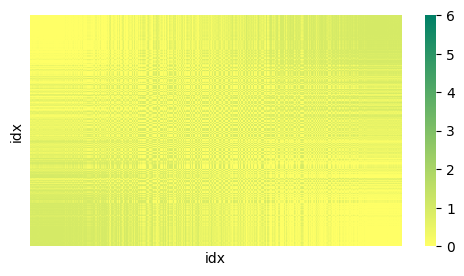

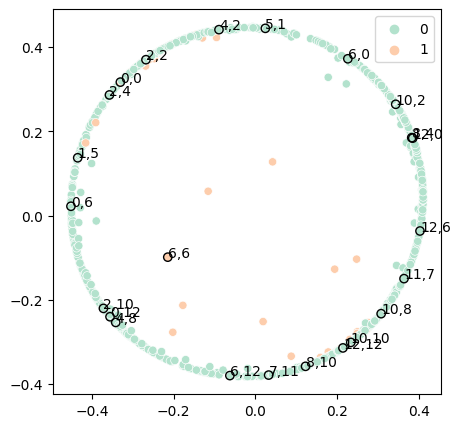

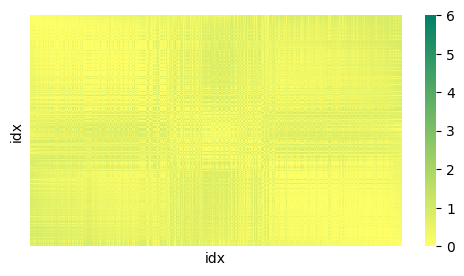

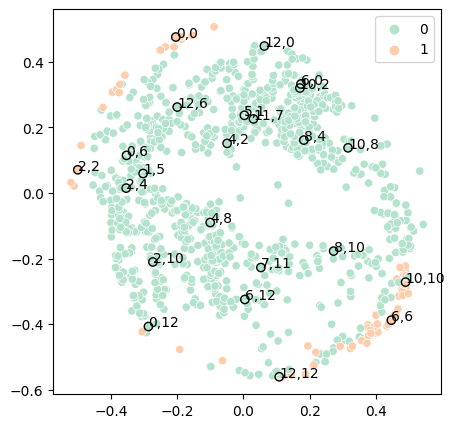

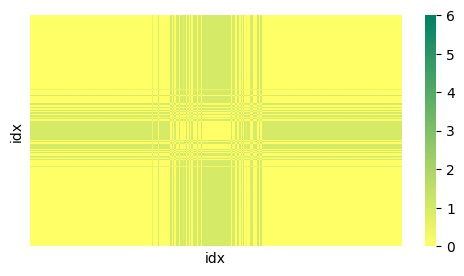

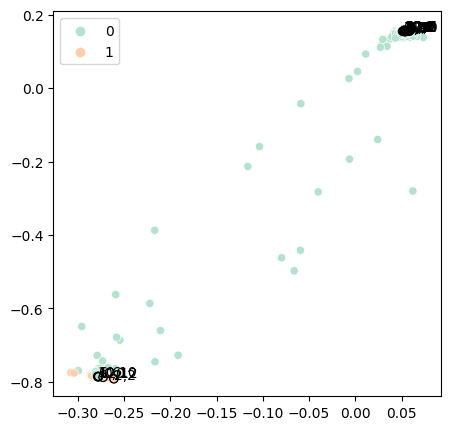

In [14]:
np.random.seed(42)
random.seed(42)

task = 'task1'
parent_dir = f'imgs/clf_bias/{task}/corr_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=1)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity 3D**

In [ ]:
for model_name, model_dict in models['experiment1'].items():
    Z, y = get_encodings(model_dict, idxs, task_num=1)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m, n_components=3)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    fig, ax = plot_embeddings_3d(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')
    fig.show()

##### base vs task0

**euclidean dissimilarity**

/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


KeyboardInterrupt: 

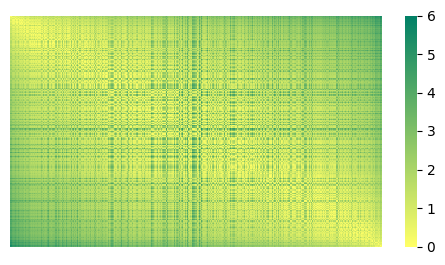

In [15]:
np.random.seed(42)
random.seed(42)

task = 'task0'
parent_dir = f'imgs/clf_bias/{task}/eucl_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=0)
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity**

/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/var/folders/65/017sb9lj6036j9yxl_qx_d940000gn/T/ipykernel_1913/2047909287.py:22: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/leodamato/.python-envs/bvae-env/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/var/folders/65/017sb9lj6036j9yxl_qx_d940000gn/T/ipykernel_1913/2047909287.py:22: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, 

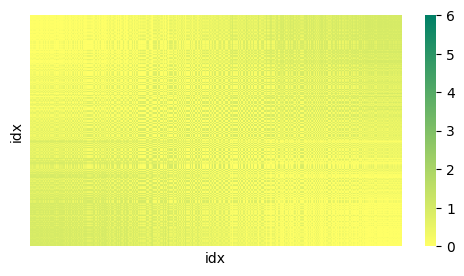

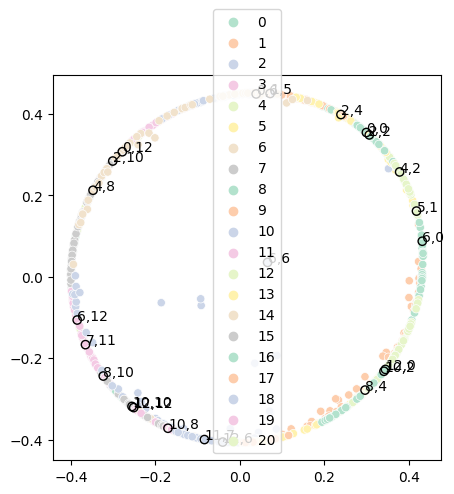

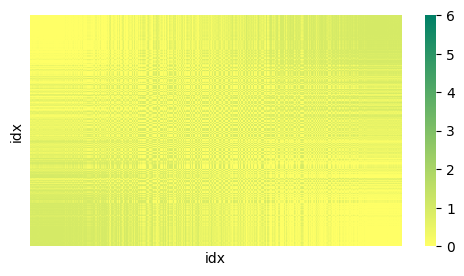

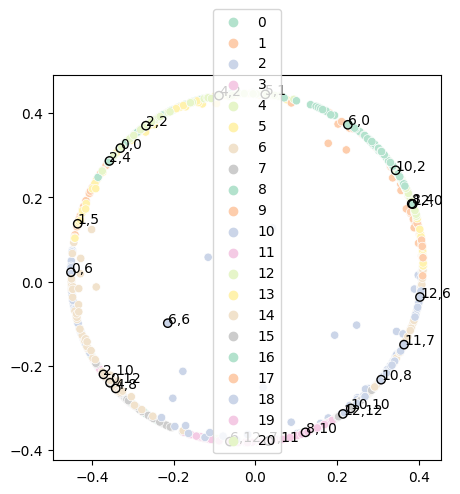

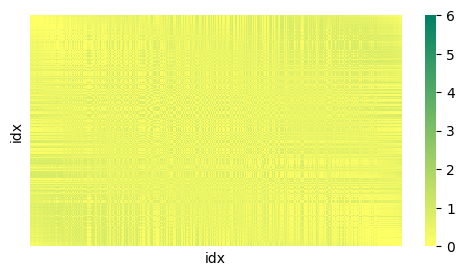

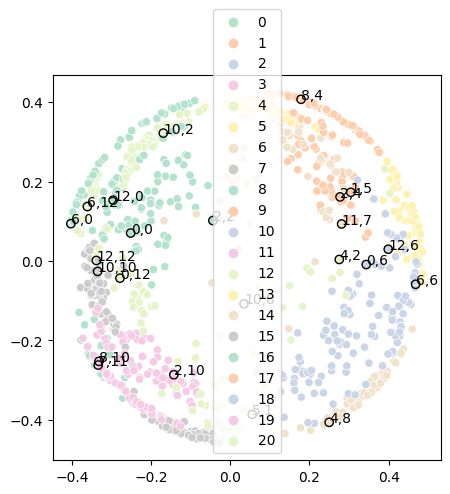

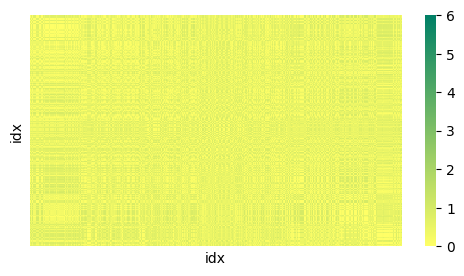

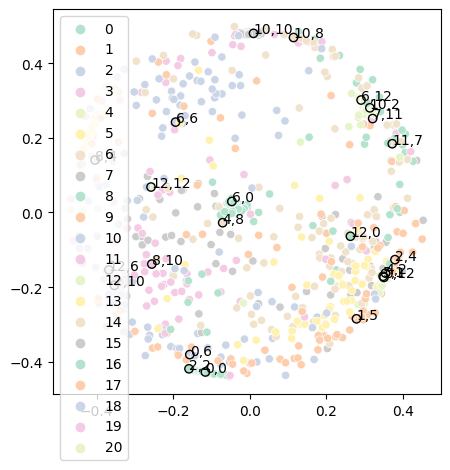

In [ ]:
np.random.seed(42)
random.seed(42)

task = 'task0'
parent_dir = f'imgs/clf_bias/{task}/corr_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=0)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity 3D**

In [ ]:
for model_name, model_dict in models['experiment0'].items():
    Z, y = get_encodings(model_dict, idxs, task_num=0)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m, n_components=3)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    fig, ax = plot_embeddings_3d(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')
    fig.show()

---

### Statistical bias

In [1]:
import torch
import random
import numpy as np
import pandas as pd
from sklearn.manifold import MDS
from sklearn.metrics import pairwise_distances
import seaborn as sns
import matplotlib.pyplot as plt
from utils import load_experiment


def get_encodings(model_dict, idxs, task_num=2, data_path=None):
    dataset, model, config = load_experiment(model_dict['config'], model_dict['ckpt'], data_path=data_path)
    X, y = dataset[idxs]
    y = y.detach().numpy()
    if task_num==0:
        condition = y[:,1] > 6
    elif task_num==1:
        condition = y[:,0] == y[:,1]

    y = np.where(condition, 1, 0)
    
    mu, logvar = model.encode(X)
    #Z = model.reparameterize(mu, logvar).detach().numpy()
    mu = mu.detach().numpy()
    # logvar = logvar.detach().numpy()
    #Z = np.concatenate([mu, logvar], axis=1)
    return mu, y

def compute_dissimilarity_m(idxs, enc, **kwargs):
    l = enc.shape[1]
    df = pd.DataFrame(enc, columns=[f'z{i}' for i in range(l)])
    df['idx'] = idxs
    df.set_index('idx', inplace=True)
    return .5 * (1 - df.T.corr())

def compute_dissimilarity_m1(idxs, enc, **kwargs):
    return pd.DataFrame(data=pairwise_distances(enc), columns=idxs, index=idxs)


def get_embeddings(diss_m, n_components=2, **kwargs):
    embedding = MDS(n_components=n_components, dissimilarity='precomputed', random_state=42, **kwargs)
    out_ = embedding.fit_transform(diss_m)
    return out_

def get_idx2label(row):
    return f'{row[169]},{row[170]}' 

#### select images

In [25]:
data = pd.read_csv('data/mazes_200k_2corridors_13x13.csv', header=None)
data = data.iloc[180_000:]
data['diff'] = data.iloc[:,169] - data.iloc[:,170]
#data = data.sort_values(by=['diff'])
n_imgs = 1000
idxs = data.sample(n_imgs).index
selected_idxs = [
    185_044, #0,12
    199_915, #2,10
    194_158, #4,8
    189_971, #6,6
    190_889, #8,4
    187_869, #10,2
    193_280, #12,0
    191126, #0,0
    185419, #2,2
    198997, #10,10
    197722, #12,12
    195734, #2,4
    194955, #4,2
    198524, #8,10
    185387, #10,8
    198185, #6,12
    192299, #6,0
    191412, #12,6
    188274, #0,6
    #185250, #6,4
    #196000, #6,8
    190549, #1,5
    190769, #5,1
    186536, #7,11
    188431, #11,7
]
idxs = idxs.union(selected_idxs)
data = data.loc[idxs].sort_values(by=['diff'])
idxs = data.index
idx2label = data.apply(get_idx2label, axis=1).to_dict()

In [10]:
data = pd.read_csv('data/mazes_85k_2corridors_AlignedBias3000vs300.csv', header=None)
data = data.iloc[80_000:]
data['diff'] = data.iloc[:,169] - data.iloc[:,170]
#data = data.sort_values(by=['diff'])
n_imgs = 1000
idxs = data.sample(n_imgs).index
selected_idxs = [
    80000
]
idxs = idxs.union(selected_idxs)
data = data.loc[idxs].sort_values(by=['diff'])
idxs = data.index
idx2label = data.apply(get_idx2label, axis=1).to_dict()

In [26]:
reidxs = {idx: i for i, idx in enumerate(idxs)}
reidx2label = {reidxs[idx]: idx2label[idx] for idx in idxs}
selected_reidxs = [reidxs[selected_idx] for selected_idx in selected_idxs]


# idx to be annotated in the scatter plot
idx_toLabel = []#list(range(0, n_imgs, 50))
idx_toLabel.extend(selected_reidxs)

#### select models

In [12]:
models = {

    'experiment0':{
        'base_high': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/hparams.yaml', 
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'base_low': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
        'task0_high': {
            'config': 'logs/BetaVAE_BottomBiasL2000R260_2Corridors/max_c_10/hparams.yaml',
            'data_path': 'data/mazes_200k_2corridors_13x13.csv',
            'ckpt': 'logs/BetaVAE_BottomBiasL2000R260_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'task0_low': {
            'config': 'logs/BetaVAE_BottomBiasL2000R260_2Corridors/max_c_0.3/hparams.yaml',
            'data_path': 'data/mazes_200k_2corridors_13x13.csv',
            'ckpt': 'logs/BetaVAE_BottomBiasL2000R260_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
    },
    
    'experiment1':{
        'base_high': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/hparams.yaml', 
            'data_path': 'data/mazes_85k_2corridors_AlignedBias3000vs300.csv',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'base_low': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/hparams.yaml',
            'data_path': 'data/mazes_85k_2corridors_AlignedBias3000vs300.csv',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
        'task1_high': {
            'config': 'logs/BetaVAE_AlignBias3000vs300_2Corridors/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_AlignBias3000vs300_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'task1_low': {
            'config': 'logs/BetaVAE_AlignBias3000vs300_2Corridors/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_AlignBias3000vs300_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
    },
}

#### plot

In [13]:
def plot_diss_m(diss_m, title, **kwargs):
    fig, ax = plt.subplots(figsize=(6, 3))
    ax.set_title(title)
    sns.heatmap(diss_m, ax=ax, annot=False, cmap='summer_r', xticklabels=False, yticklabels=False, **kwargs)
    return fig, ax

def plot_embeddings(emb, y, idx_toLabel, reidx2label, title):
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.set_title(title)
    sns.scatterplot(x=emb[:,0], y=emb[:,1], hue=y, palette='Pastel2', ax=ax)
    ax.set_xticks([])
    ax.set_yticks([])
    for i in idx_toLabel:
        txt = reidx2label[i]
        ax.annotate(txt, (emb[i,0], emb[i,1]), size=10)
    return fig, ax

def plot_embeddings_3d(emb, y, idx_toLabel, reidx2label, title):
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title(title)
    ax.scatter(emb[:,0], emb[:,1], emb[:,2], c=y, s=10, cmap='Pastel2')
    for i in idx_toLabel:
        txt = reidx2label[i]
        ax.text(emb[i,0], emb[i,1], emb[i,2], txt, size=10)
        
    return fig, ax


##### Bias on bottom corridor

**euclidean dissimilarity**

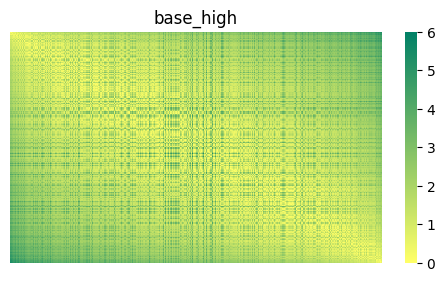

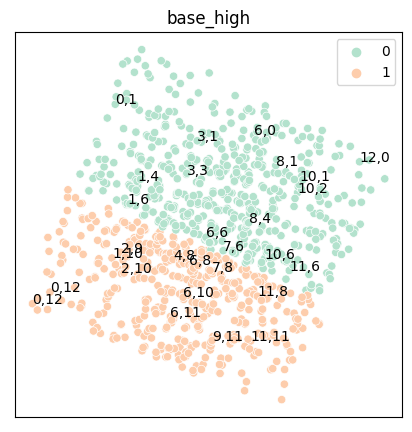

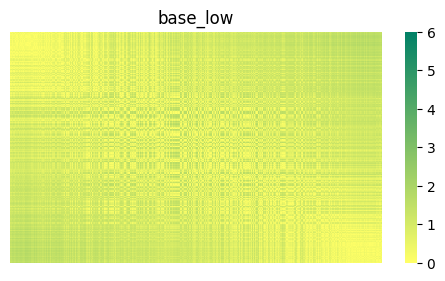

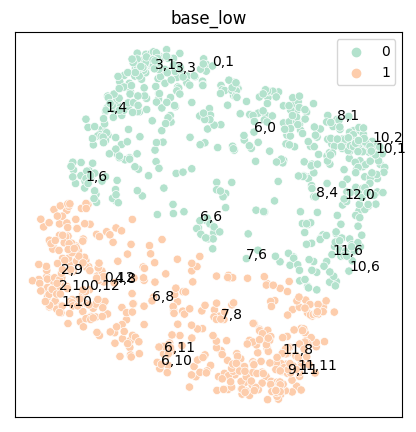

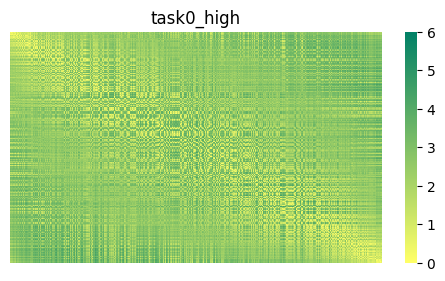

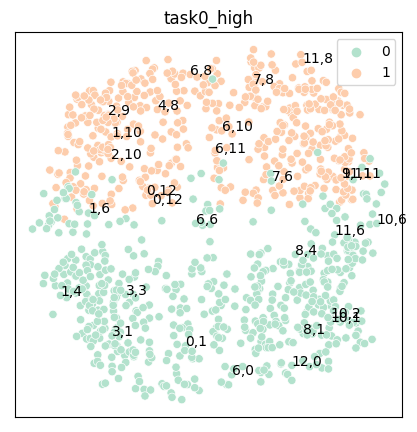

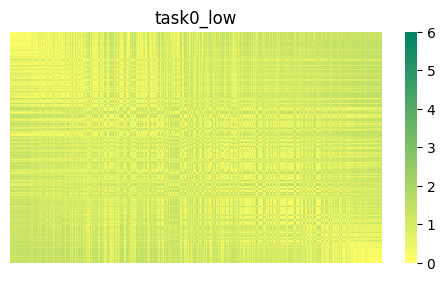

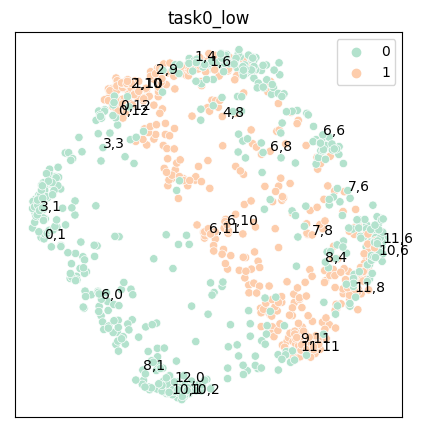

In [6]:
for model_name, model_dict in models['experiment0'].items():
    try:
        data_path = model_dict['data_path']
    except KeyError:
        data_path = None
    
    Z, y = get_encodings(model_dict, idxs, task_num=0, data_path=data_path)
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')
    fig.show()

**correlation dissimilarity**

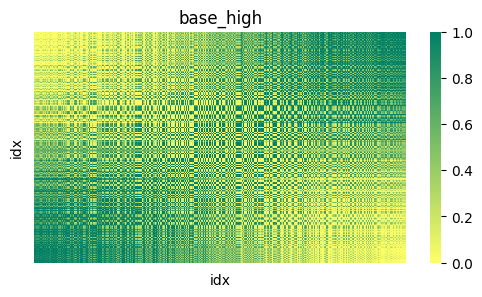

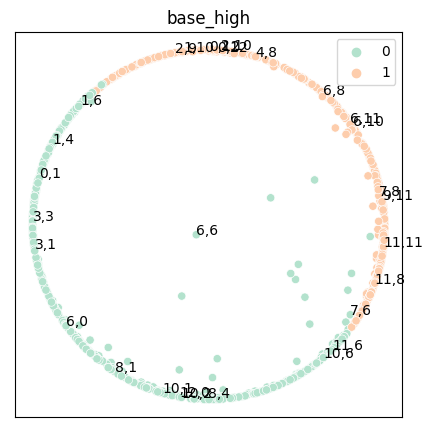

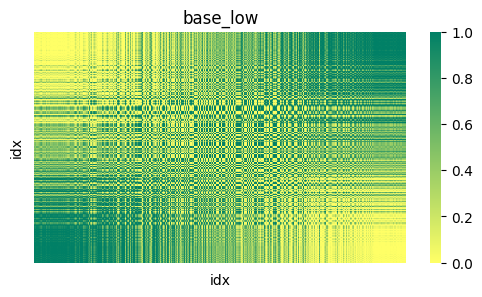

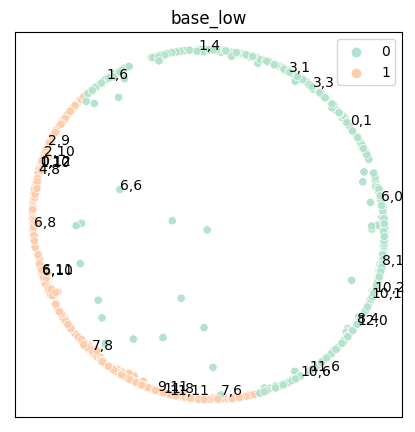

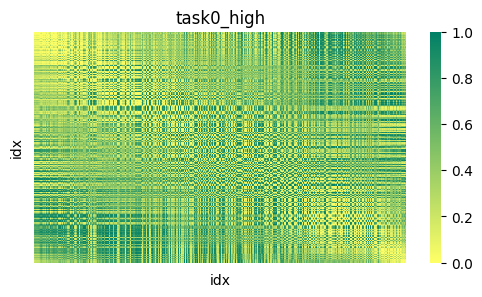

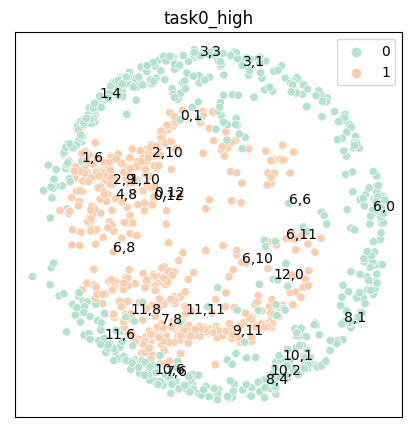

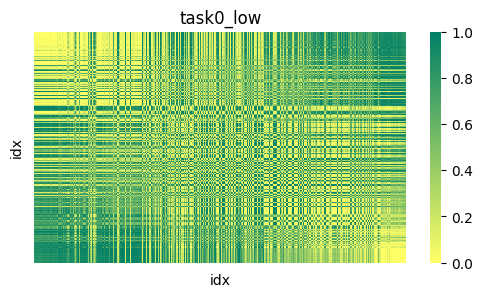

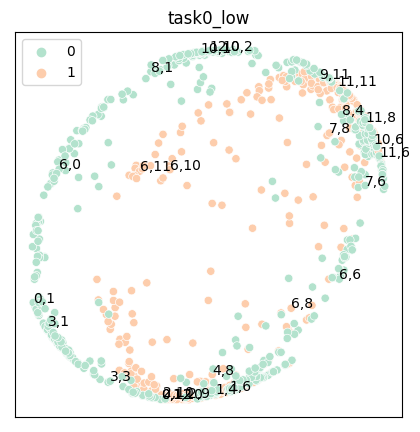

In [7]:
for model_name, model_dict in models['experiment0'].items():
    try:
        data_path = model_dict['data_path']
    except KeyError:
        data_path = None
        
    Z, y = get_encodings(model_dict, idxs, task_num=0, data_path=data_path)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m, metric=True)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')
    fig.show()

##### Bias on alignment

**euclidean dissimilarity**

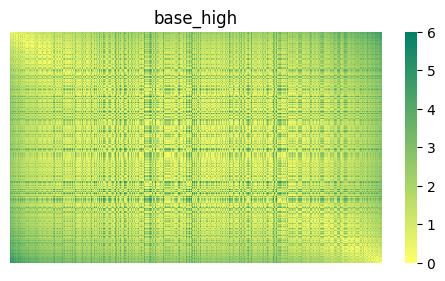

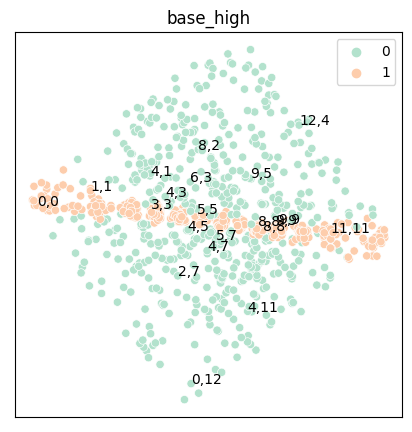

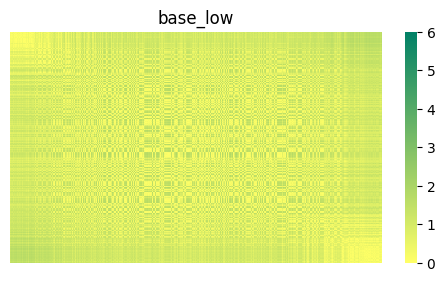

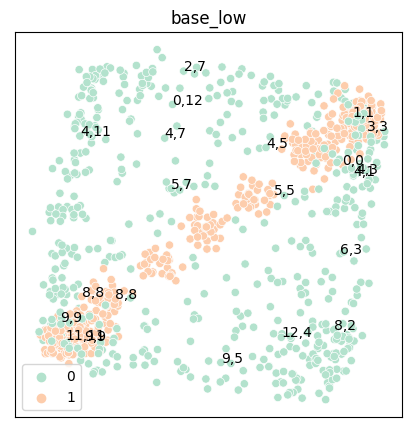

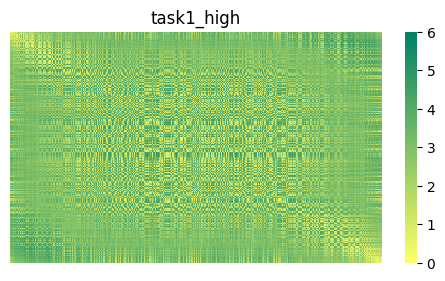

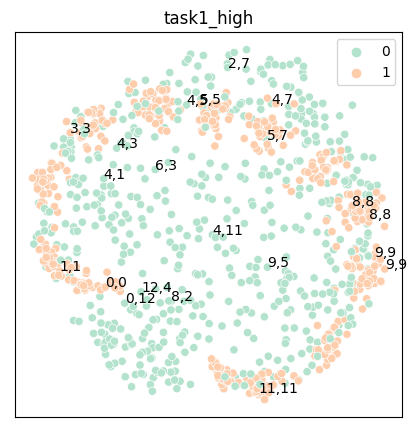

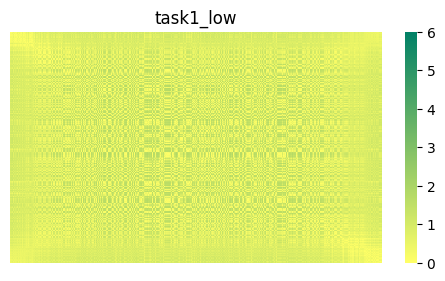

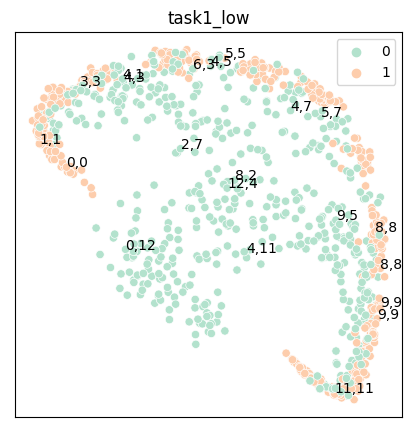

In [14]:
for model_name, model_dict in models['experiment1'].items():
    try:
        data_path = model_dict['data_path']
    except KeyError:
        data_path = None
    
    Z, y = get_encodings(model_dict, idxs, task_num=1, data_path=data_path)
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')
    fig.show()

**correlation dissimilarity**

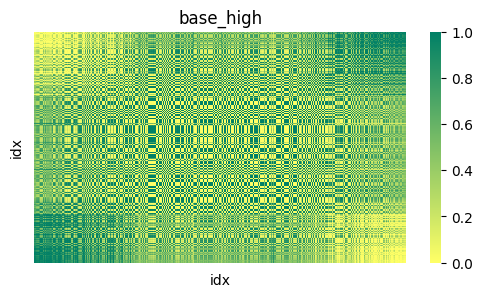

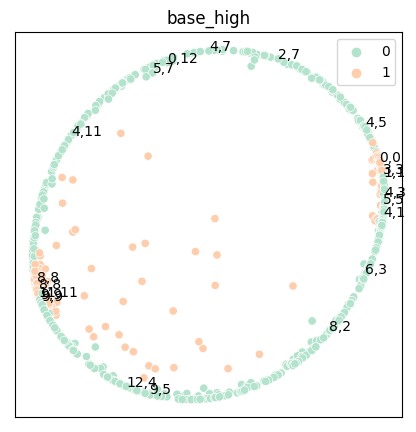

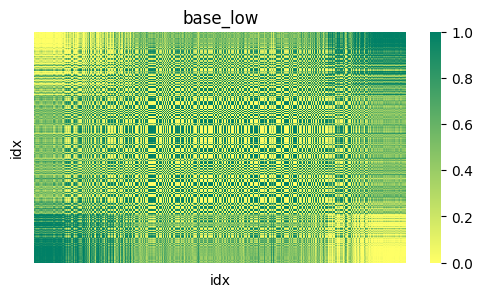

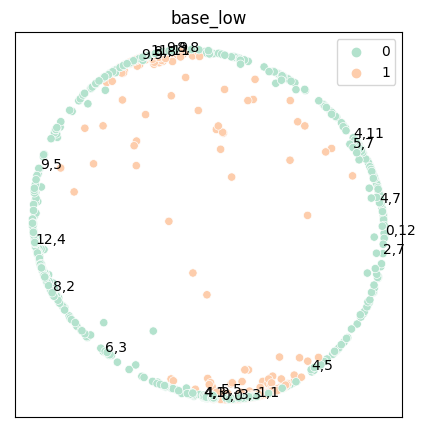

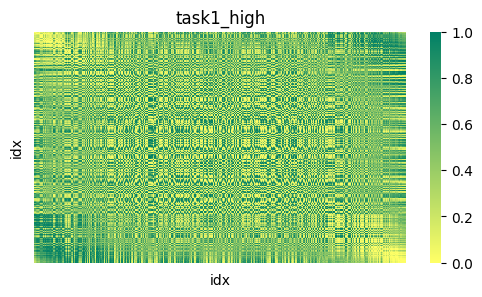

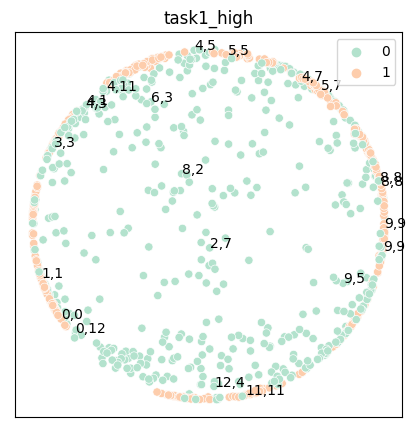

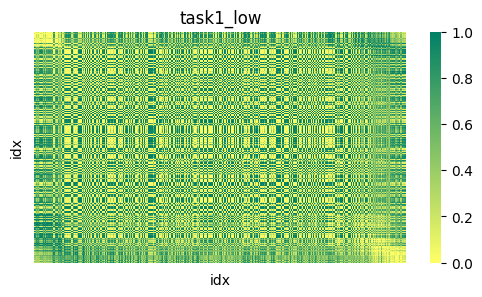

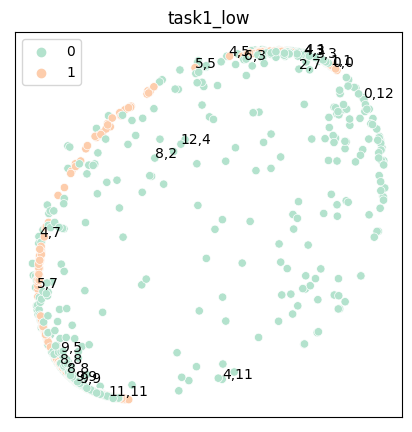

In [15]:
for model_name, model_dict in models['experiment1'].items():
    try:
        data_path = model_dict['data_path']
    except KeyError:
        data_path = None
        
    Z, y = get_encodings(model_dict, idxs, task_num=1, data_path=data_path)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m, metric=True)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')
    fig.show()